## Import Libraries

In [ ]:
import numpy as np
import pandas as pd
import datetime as dt
from datetime import datetime

from sklearn.preprocessing import MinMaxScaler

import re

from langdetect import detect

import nltk
from nltk.stem import WordNetLemmatizer
from nltk.stem.snowball import SnowballStemmer

import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

from PIL import Image
from numpy import asarray
from wordcloud import WordCloud, STOPWORDS
from nltk.corpus import stopwords
nltk.download('stopwords')
stopwords_eng = stopwords.words('english')

from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio

import seaborn as sb

## 6.3 Remove '\n' characters

In [6]:
df_eng['text'] = df_eng['text'].replace(r'\n', '', regex=True)
df_eng

,user,fullname,timestamp,year,month,day,replies,likes,retweets,text,language,date
0,bitcointe,Bitcointe,2019-05-27 11:49:18,2019,5,27,0.0,0.0,0.0,Cardano: Digitize Currencies; EOS 6500% ROI; ...,en,2019-05-27
1,3eyedbran,Bran - 3 Eyed Raven,2019-05-27 11:49:06,2019,5,27,0.0,2.0,1.0,Another Test tweet that wasn't caught in the s...,en,2019-05-27
2,DetroitCrypto,J. Scardina,2019-05-27 11:49:22,2019,5,27,0.0,0.0,0.0,Current Crypto Prices! BTC: $8721.99 USDETH: $...,en,2019-05-27
3,mmursaleen72,Muhammad Mursaleen,2019-05-27 11:49:23,2019,5,27,0.0,0.0,0.0,Spiv (Nosar Baz): BITCOIN Is An Asset &amp; NO...,en,2019-05-27
4,evilrobotted,evilrobotted,2019-05-27 11:49:25,2019,5,27,0.0,0.0,0.0,We have been building on the real #bitcoin SV...,en,2019-05-27
...,...,...,...,...,...,...,...,...,...,...,...,...
8548780,iceXzi,iceXzi,2019-11-23 15:24:08,2019,11,23,17.0,20.0,24.0,$200 #PayPal or #Bitcoin #giveaway 1) RT this ...,en,2019-11-23
8548781,JacobCanfield,Jacob Canfield,2019-11-23 15:28:50,2019,11,23,2.0,16.0,3.0,Happy #FibonacciDay A while back I created a n...,en,2019-11-23
8548782,torusJKL,Gal Buki ($torusJKL),2019-11-23 15:45:56,2019,11,23,0.0,0.0,0.0,Register now for the early access of the Codug...,en,2019-11-23
8548783,Adekunl95628158,Adekunle Daniel,2019-11-23 15:45:57,2019,11,23,0.0,0.0,0.0,Do you know that BTC Baskets isn't a bank bu...,en,2019-11-23


## 6.4 Wordcloud (English)

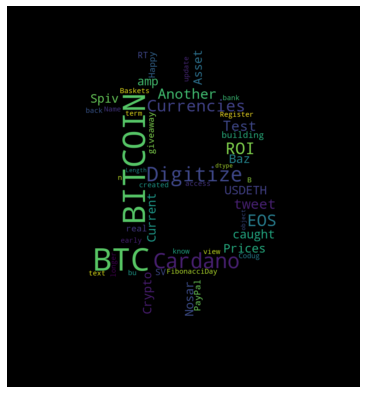

In [34]:
mask = np.array(Image.open("btc_logo.png"))

wc = WordCloud(stopwords=stopwords_eng,
               mask=mask, background_color="black",
               max_words=2000, max_font_size=256,
               random_state=42, width=mask.shape[1],
               height=mask.shape[0]).generate(str(df_eng.text))

fig = plt.figure(figsize=(7,7))

plt.imshow(wc, interpolation = 'bilinear')
plt.axis('off')
plt.show()

## 6.5 Tweets per user (English)

In [8]:
user_counts_df = df_eng[['user']].value_counts().to_frame().reset_index(drop=False)
user_counts_df = user_counts_df.rename(columns={0: "counts"})
user_counts_df.loc[user_counts_df['counts'] < 31000, 'user'] = 'Other users'
fig = px.pie(user_counts_df, values='counts', names='user', 
             title='Number of tweets per user (English)')
fig.show()

## 6.6 User influence (English)

In [116]:
df_users_eng = df_eng[['user','replies','likes','retweets']]
df_users_eng = df_users_eng.groupby([df_users_eng['user']]).sum()
df_users_eng['absolute_user_influence'] = df_users_eng.replies + df_users_eng.likes + df_users_eng.retweets
df_users_eng

,replies,likes,retweets,absolute_user_influence
user,,,,
000000000000i5,0.0,0.0,0.0,0.0
000000000000i7,0.0,0.0,0.0,0.0
000000000OOK,1.0,7.0,4.0,12.0
000001,0.0,0.0,0.0,0.0
00000MartyMcFly,0.0,0.0,0.0,0.0
...,...,...,...,...
zzznats,0.0,0.0,0.0,0.0
zzzphon,0.0,0.0,0.0,0.0
zzzrrr06734850,0.0,0.0,0.0,0.0


In [120]:
most_likes_df = df_users_eng[['likes']].nlargest(10,'likes')
most_retweets_df = df_users_eng[['retweets']].nlargest(10,'retweets')
most_replies_df = df_users_eng[['replies']].nlargest(10,'replies')
most_total_df = df_users_eng[['absolute_user_influence']].nlargest(10,'absolute_user_influence')

## 6.7 User Influence (English) (graph)

In [123]:
fig = make_subplots(
    rows=4, cols=1,
    subplot_titles=("Likes", "Retweets", "Replies", "Total absolute influence" ),
    shared_yaxes=False
)
fig.add_trace(go.Bar(x=most_likes_df.index, y=most_likes_df.likes,
                    marker=dict(color=most_likes_df.likes, coloraxis="coloraxis")),
              1, 1)
fig.add_trace(go.Bar(x=most_retweets_df.index, y=most_retweets_df.retweets,
                    marker=dict(color=most_retweets_df.retweets, coloraxis="coloraxis")),
              2, 1)
fig.add_trace(go.Bar(x=most_replies_df.index, y=most_replies_df.replies,
                    marker=dict(color=most_replies_df.replies, coloraxis="coloraxis")),
              3, 1)
fig.add_trace(go.Bar(x=most_total_df.index, y=most_total_df.absolute_user_influence,
                    marker=dict(color=most_total_df.absolute_user_influence, coloraxis="coloraxis")),
              4, 1)
fig.update_layout(height=1000, width=989, coloraxis=dict(colorscale='Bluered'), showlegend=False)

fig.show()

# Sentiment analysis

## 7.1 Remove tweets before 29-04-2013

In [ ]:
startdate = pd.to_datetime("2013-04-29", format='%Y-%m-%d %H:%M:%S', errors='coerce')
df_eng['timestamp'] = pd.to_datetime(df_eng['timestamp'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df = df_eng.loc[df_eng['timestamp'] >= startdate]
df.sort_values(by=['timestamp'])

In [49]:
df = df.drop(columns={'language'})
df

,user,fullname,timestamp,year,month,day,replies,likes,retweets,text
0,bitcointe,Bitcointe,2019-05-27 11:49:18,2019,5,27,0.0,0.0,0.0,Cardano: Digitize Currencies; EOS 6500% ROI; ...
1,3eyedbran,Bran - 3 Eyed Raven,2019-05-27 11:49:06,2019,5,27,0.0,2.0,1.0,Another Test tweet that wasn't caught in the s...
2,DetroitCrypto,J. Scardina,2019-05-27 11:49:22,2019,5,27,0.0,0.0,0.0,Current Crypto Prices! BTC: $8721.99 USDETH: $...
3,mmursaleen72,Muhammad Mursaleen,2019-05-27 11:49:23,2019,5,27,0.0,0.0,0.0,Spiv (Nosar Baz): BITCOIN Is An Asset &amp; NO...
4,evilrobotted,evilrobotted,2019-05-27 11:49:25,2019,5,27,0.0,0.0,0.0,We have been building on the real #bitcoin SV...
...,...,...,...,...,...,...,...,...,...,...
8548780,iceXzi,iceXzi,2019-11-23 15:24:08,2019,11,23,17.0,20.0,24.0,$200 #PayPal or #Bitcoin #giveaway 1) RT this ...
8548781,JacobCanfield,Jacob Canfield,2019-11-23 15:28:50,2019,11,23,2.0,16.0,3.0,Happy #FibonacciDay A while back I created a n...
8548782,torusJKL,Gal Buki ($torusJKL),2019-11-23 15:45:56,2019,11,23,0.0,0.0,0.0,Register now for the early access of the Codug...
8548783,Adekunl95628158,Adekunle Daniel,2019-11-23 15:45:57,2019,11,23,0.0,0.0,0.0,Do you know that BTC Baskets isn't a bank bu...


## 7.2 Polarity analysis (per tweet)

In [50]:
sid = SentimentIntensityAnalyzer()

def text_polarity(text):
    return sid.polarity_scores(text)['compound']

#Polarity analysis
df['polarity'] = df['text'].apply(text_polarity)
df

,user,fullname,timestamp,year,month,day,replies,likes,retweets,text,polarity
0,bitcointe,Bitcointe,2019-05-27 11:49:18,2019,5,27,0.0,0.0,0.0,Cardano: Digitize Currencies; EOS 6500% ROI; ...,-0.1027
1,3eyedbran,Bran - 3 Eyed Raven,2019-05-27 11:49:06,2019,5,27,0.0,2.0,1.0,Another Test tweet that wasn't caught in the s...,0.0000
2,DetroitCrypto,J. Scardina,2019-05-27 11:49:22,2019,5,27,0.0,0.0,0.0,Current Crypto Prices! BTC: $8721.99 USDETH: $...,0.0000
3,mmursaleen72,Muhammad Mursaleen,2019-05-27 11:49:23,2019,5,27,0.0,0.0,0.0,Spiv (Nosar Baz): BITCOIN Is An Asset &amp; NO...,0.3612
4,evilrobotted,evilrobotted,2019-05-27 11:49:25,2019,5,27,0.0,0.0,0.0,We have been building on the real #bitcoin SV...,-0.4767
...,...,...,...,...,...,...,...,...,...,...,...
8548780,iceXzi,iceXzi,2019-11-23 15:24:08,2019,11,23,17.0,20.0,24.0,$200 #PayPal or #Bitcoin #giveaway 1) RT this ...,0.7378
8548781,JacobCanfield,Jacob Canfield,2019-11-23 15:28:50,2019,11,23,2.0,16.0,3.0,Happy #FibonacciDay A while back I created a n...,0.9273
8548782,torusJKL,Gal Buki ($torusJKL),2019-11-23 15:45:56,2019,11,23,0.0,0.0,0.0,Register now for the early access of the Codug...,0.0000
8548783,Adekunl95628158,Adekunle Daniel,2019-11-23 15:45:57,2019,11,23,0.0,0.0,0.0,Do you know that BTC Baskets isn't a bank bu...,0.8800


## 7.3 Polarity to sentiment (per tweet)

In [54]:
def polarity_to_sentiment(polarity):
    if polarity == 0:
        return "Neutral"
    elif (polarity > 0) and (polarity < 0.5):
        return "Weakly Positive"
    elif (polarity < 0) and (polarity > -0.5):
        return "Weakly Negative"
    elif (polarity > 0.5):
        return "Strongly Positive"
    elif (polarity < -0.5):
        return "Strongly Negative"
    
#Polarity to sentiment
df['sentiment'] = df['polarity'].apply(polarity_to_sentiment) 
df

,user,fullname,timestamp,year,month,day,replies,likes,retweets,text,polarity,sentiment
0,bitcointe,Bitcointe,2019-05-27 11:49:18,2019,5,27,0.0,0.0,0.0,Cardano: Digitize Currencies; EOS 6500% ROI; ...,-0.1027,Weakly Negative
1,3eyedbran,Bran - 3 Eyed Raven,2019-05-27 11:49:06,2019,5,27,0.0,2.0,1.0,Another Test tweet that wasn't caught in the s...,0.0000,Neutral
2,DetroitCrypto,J. Scardina,2019-05-27 11:49:22,2019,5,27,0.0,0.0,0.0,Current Crypto Prices! BTC: $8721.99 USDETH: $...,0.0000,Neutral
3,mmursaleen72,Muhammad Mursaleen,2019-05-27 11:49:23,2019,5,27,0.0,0.0,0.0,Spiv (Nosar Baz): BITCOIN Is An Asset &amp; NO...,0.3612,Weakly Positive
4,evilrobotted,evilrobotted,2019-05-27 11:49:25,2019,5,27,0.0,0.0,0.0,We have been building on the real #bitcoin SV...,-0.4767,Weakly Negative
...,...,...,...,...,...,...,...,...,...,...,...,...
8516869,iceXzi,iceXzi,2019-11-23 15:24:08,2019,11,23,17.0,20.0,24.0,$200 #PayPal or #Bitcoin #giveaway 1) RT this ...,0.7378,Strongly Positive
8516870,JacobCanfield,Jacob Canfield,2019-11-23 15:28:50,2019,11,23,2.0,16.0,3.0,Happy #FibonacciDay A while back I created a n...,0.9273,Strongly Positive
8516871,torusJKL,Gal Buki ($torusJKL),2019-11-23 15:45:56,2019,11,23,0.0,0.0,0.0,Register now for the early access of the Codug...,0.0000,Neutral
8516872,Adekunl95628158,Adekunle Daniel,2019-11-23 15:45:57,2019,11,23,0.0,0.0,0.0,Do you know that BTC Baskets isn't a bank bu...,0.8800,Strongly Positive


# Checkpoint 4

In [ ]:
df.to_csv('tweets_sentiment.csv',index=False)